In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

START = 2018
END = 2025

In [2]:
# RAG+LLM 추출 내용 load
def get_extracted_data(start : int = START, end : int = END):
    papers = {}
    models = {}
    metrics = {}

    for i in range(start, end+1):
        papers[f"{i}"] = pd.read_csv(f"./res/{i}/papers.csv")
        models[f"{i}"] = pd.read_csv(f"./res/{i}/models.csv")
        metrics[f"{i}"] = pd.read_csv(f"./res/{i}/metrics.csv")

    return papers, models, metrics

# 메타데이터 불러오는 헬퍼 함수
def get_metadata(start : int = START, end : int = END) -> dict[str, pd.DataFrame]:
    metadatas = {}

    for i in range(start, end+1):
        root = f"./res/{i}/metadata"
        metadatas[f"{i}"] = pd.concat(
            [
                pd.read_csv(os.path.join(root, file_name)).assign(keyword=file_name[:-4])
                for file_name in os.listdir(root)
                if file_name.endswith(".csv")
            ],
            axis=0,
            ignore_index=True
        )
        metadatas[f"{i}"] = metadatas[f"{i}"].dropna(subset=["Document Title"])
        metadatas[f"{i}"]["Abstract"] = metadatas[f"{i}"]["Abstract"].astype(str)
        
    return metadatas


metadatas = get_metadata()
papers, models, metrics = get_extracted_data()


# 파라미터 증가 대비 성능 향상 폭 분석

In [3]:
models_metrics = {}

for i in range(START, END+1):
    models_metrics[str(i)] = pd.merge(models[str(i)], metrics[str(i)], on=["paper_id", "model_id"])

In [4]:

def preprocess_metrics_dict(models_metrics, weight: float = 3.0):
    cleaned_dict = {}
    
    for year, df in models_metrics.items():
        if df.empty:
            cleaned_dict[year] = df
            continue
            
        working_df = df.copy()
        working_df = working_df.dropna(subset=['metric_value'])

        working_df.loc[
            (working_df['metric_value'] > 0) & 
            (working_df['metric_value'] <= 1),
            'metric_value'
        ] *= 100
        working_df = working_df[
            (working_df['metric_value'] >= 0) &
            (working_df['metric_value'] <= 100)
        ]

        
        def filter_outliers_mad(group):
            if len(group) < 4:
                return group
            
            values = group['metric_value'].values
            
            median = np.median(values)
            mad = np.median(np.abs(values - median))
            
            if mad == 0:
                return group
            
            lower_bound = median - weight * mad
            upper_bound = median + weight * mad
            
            return group[
                (group['metric_value'] >= lower_bound) &
                (group['metric_value'] <= upper_bound)
            ]

        if not working_df.empty:
            cleaned_df = (
                working_df
                .groupby('task', group_keys=False)
                .apply(filter_outliers_mad)
            )
        else:
            cleaned_df = working_df
            
        cleaned_dict[year] = cleaned_df
        
    print(f"전처리 완료: {len(models_metrics)}개 연도 데이터 처리됨.")
    return cleaned_dict


cleaned_models_metrics = preprocess_metrics_dict(models_metrics, weight=3.0)

전처리 완료: 8개 연도 데이터 처리됨.


/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/34477478.py:47: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(filter_outliers_mad)
/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/34477478.py:47: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(filter_outliers_mad)
/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/34477478.py:47: FutureWarning: DataFrameGroup

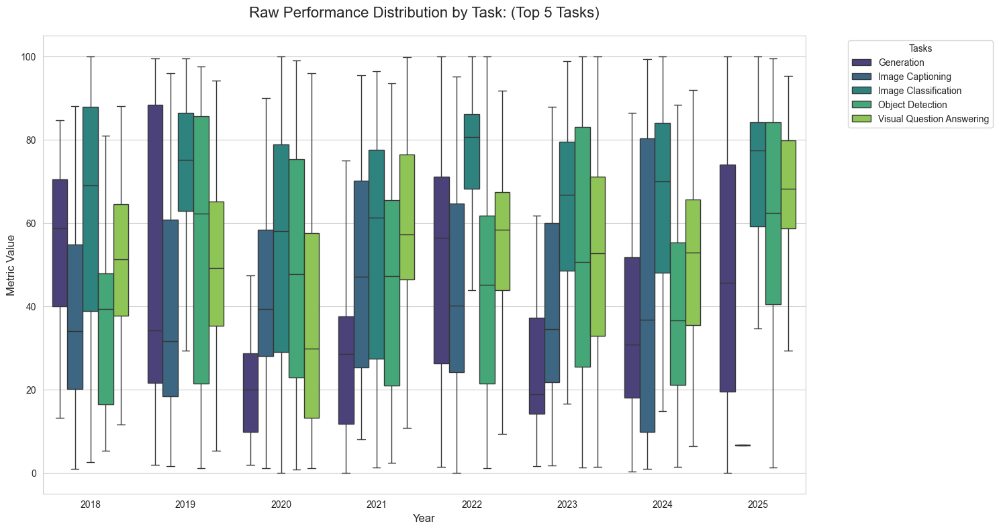

In [5]:

def visualize_task_boxplots(models_dict, k=5, normalize=False, use_log=False, exclude_tasks=['Other']):
    """
    Task별 모델 성능(metric_value)의 분포를 년도별 Boxplot으로 시각화하는 함수
    
    Args:
        models_dict (dict): {year: dataframe} 형태의 데이터 (2018~2025)
        k (int): 상위 몇 개의 Task를 보여줄 것인지 설정
        normalize (bool): 태스크별 Min-Max 정규화 수행 여부
        use_log (bool): Y축 로그 스케일 적용 여부
        exclude_tasks (list): 제외할 Task 리스트
    """
    
    def preprocess_data(models_dict):
        df_list = []
        for year, df in models_dict.items():
            if df.empty: continue
            temp_df = df.copy()
            temp_df['year'] = int(year)  
            df_list.append(temp_df)
        
        combined_df = pd.concat(df_list, ignore_index=True)
        
        # 제외할 태스크 필터링
        for task in exclude_tasks:
            combined_df = combined_df[combined_df['task'] != task]
        return combined_df

    def filter_top_tasks(df, top_k):
        # 데이터 포인트가 많은 순서대로 상위 k개 추출
        top_tasks = df['task'].value_counts().nlargest(top_k).index
        return df[df['task'].isin(top_tasks)].copy()

    def apply_normalization(df):
        def normalize_group(group):
            min_val = group.min()
            max_val = group.max()
            if max_val - min_val == 0: return 0.5 # 분모가 0인 경우 처리
            return (group - min_val) / (max_val - min_val)
        
        df['target_value'] = df.groupby('task')['metric_value'].transform(normalize_group)
        return df

    total_df = preprocess_data(models_dict)
    total_df = total_df.dropna(subset=['metric_value'])
    filtered_df = filter_top_tasks(total_df, k)
    
    y_label = 'Metric Value'
    title_suffix = f'(Top {k} Tasks)'
    
    if normalize:
        filtered_df = apply_normalization(filtered_df)
        y_col = 'target_value'
        y_label = 'Normalized Scale (0 to 1)'
        title_prefix = 'Normalized'
    else:
        filtered_df['target_value'] = filtered_df['metric_value']
        y_col = 'target_value'
        title_prefix = 'Raw'


    plt.figure(figsize=(15, 8))
    sns.set_style("whitegrid")
    sns.boxplot(
        data=filtered_df, 
        x='year', 
        y=y_col, 
        hue='task', 
        showfliers=False,  
        palette='viridis'
    )

    if use_log and not normalize:
        if (filtered_df[y_col] > 0).all():
            plt.yscale("log")
            y_label += ' (Log Scale)'
    
    plt.title(f'{title_prefix} Performance Distribution by Task: {title_suffix}', fontsize=16, pad=20)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(y_label, fontsize=12)
    
    plt.legend(title='Tasks', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    
    plt.show()

visualize_task_boxplots(cleaned_models_metrics, k=5, normalize=False, use_log=True)

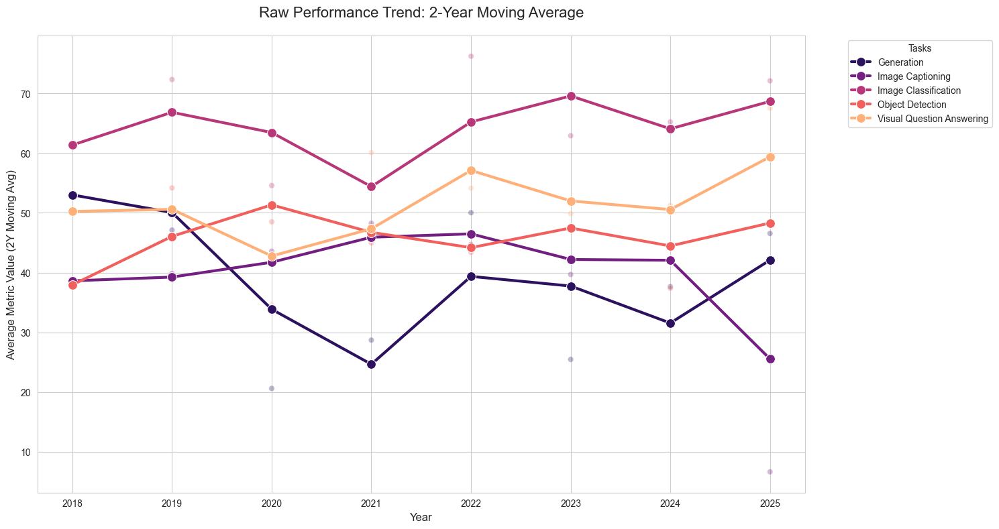

In [6]:

def visualize_task_moving_average(models_dict, k=5, window=2, normalize=False, exclude_tasks=['Other']):
    """
    Task별 평균 성능에 이동평균을 적용하여 연도별 추이를 시각화하는 함수
    
    Args:
        models_dict (dict): {year: dataframe} 형태의 데이터
        k (int): 상위 몇 개의 Task를 보여줄 것인지 설정
        window (int): 이동평균을 계산할 윈도우 크기 (기본값 2년)
        normalize (bool): 태스크별 Min-Max 정규화 수행 여부
        exclude_tasks (list): 제외할 Task 리스트
    """
    
    def preprocess_data(models_dict):
        df_list = []
        for year, df in models_dict.items():
            if df.empty: continue
            temp_df = df.copy()
            temp_df['year'] = int(year)
            df_list.append(temp_df)
        
        combined_df = pd.concat(df_list, ignore_index=True)
        for task in exclude_tasks:
            combined_df = combined_df[combined_df['task'] != task]
        return combined_df

    total_df = preprocess_data(models_dict)
    total_df = total_df.dropna(subset=['metric_value'])
    
    top_tasks = total_df['task'].value_counts().nlargest(k).index
    filtered_df = total_df[total_df['task'].isin(top_tasks)].copy()

    summary_df = filtered_df.groupby(['task', 'year'])['metric_value'].mean().reset_index()
    summary_df = summary_df.sort_values(['task', 'year'])

    y_col = 'metric_value'
    y_label = f'Average Metric Value ({window}Y Moving Avg)'
    
    if normalize:
        def normalize_group(group):
            return (group - group.min()) / (group.max() - group.min() + 1e-6)
        summary_df['display_value'] = summary_df.groupby('task')['metric_value'].transform(normalize_group)
        y_col = 'display_value'
        y_label = f'Normalized Avg ({window}Y Moving Avg)'

    summary_df['moving_avg'] = summary_df.groupby('task')[y_col].transform(
        lambda x: x.rolling(window=window, min_periods=1).mean()
    )

    plt.figure(figsize=(15, 8))
    sns.set_style("whitegrid")
    
    sns.lineplot(
        data=summary_df,
        x='year',
        y='moving_avg',
        hue='task',
        marker='o',
        linewidth=3,
        markersize=10,
        palette='magma'
    )
    
    sns.scatterplot(
        data=summary_df,
        x='year',
        y=y_col,
        hue='task',
        alpha=0.3,
        legend=False,
        palette='magma'
    )

    title_prefix = "Normalized" if normalize else "Raw"
    plt.title(f'{title_prefix} Performance Trend: {window}-Year Moving Average', fontsize=16, pad=20)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(y_label, fontsize=12)
    plt.xticks(sorted(summary_df['year'].unique()))
    
    plt.legend(title='Tasks', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


visualize_task_moving_average(cleaned_models_metrics, k=5, window=2, normalize=False)

In [7]:
def plot_dataset_ratio_stacked_bar(models_metrics, task, start_year=START, end_year=END):
    """
    년도별 데이터셋 사용 비율을 가로형 누적 막대 그래프(Stacked Bar)로 시각화합니다.
    """
    years = [str(y) for y in range(start_year, end_year + 1)]
    data_list = []
    
    for year in years:
        if year in models_metrics:
            df = models_metrics[year]
            task_df = df[df['task'] == task]
            
            if not task_df.empty:
        
                counts = task_df['dataset'].value_counts(normalize=True) * 100
                counts_dict = counts.to_dict()
                counts_dict['year'] = year
                data_list.append(counts_dict)
            else:
                data_list.append({'year': year})
        else:
            data_list.append({'year': year})

    plot_df = pd.DataFrame(data_list).set_index('year').fillna(0)
    
    if plot_df.sum().sum() == 0:
        print(f"해당 Task({task})에 대한 데이터가 존재하지 않습니다.")
        return

    ax = plot_df.plot(kind='barh', 
                      stacked=True, 
                      figsize=(12, 7), 
                      colormap='tab20c', # 깔끔한 색상 조합
                      width=0.7)

    plt.title(f"Dataset Usage Ratio per Year [{task}]", fontsize=16, pad=20)
    plt.xlabel("Percentage (%)", fontsize=12)
    plt.ylabel("Year", fontsize=12)
    plt.legend(title="Datasets", bbox_to_anchor=(1.02, 1), loc='upper left')
    
    for p in ax.patches:
        width = p.get_width()
        if width > 3:  # 3% 이상인 경우에만 텍스트 표시
            x, y = p.get_xy()
            ax.text(x + width/2, y + p.get_height()/2, 
                    f'{width:.1f}%', 
                    va='center', ha='center', 
                    fontsize=9, color='white', fontweight='bold')

    plt.tight_layout()
    plt.show()


def plot_dataset_ratio_stream_graph(models_metrics, task, start_year=START, end_year=END):
    """
    년도별 데이터셋 사용 비율을 스트림 그래프(Stream Graph)로 시각화합니다.
    """
    years = [y for y in range(start_year, end_year + 1)]
    data_list = []
    
    for year in years:
        year_str = str(year)
        if year_str in models_metrics:
            df = models_metrics[year_str]
            task_df = df[df['task'] == task]
            
            if not task_df.empty:
                counts = task_df['dataset'].value_counts(normalize=True) * 100
                counts_dict = counts.to_dict()
                counts_dict['year'] = year
                data_list.append(counts_dict)
            else:
                data_list.append({'year': year})
        else:
            data_list.append({'year': year})

    plot_df = pd.DataFrame(data_list).set_index('year').fillna(0)
    
    if plot_df.sum().sum() == 0:
        print(f"해당 Task({task})에 대한 데이터가 존재하지 않습니다.")
        return

    x = plot_df.index.astype(int)
    y = plot_df.T.values # 각 데이터셋의 비율 데이터

    fig, ax = plt.subplots(figsize=(14, 8))
    
    colors = plt.cm.tab20c(np.linspace(0, 1, len(plot_df.columns)))
    
    ax.stackplot(x, y, 
                 labels=plot_df.columns, 
                 baseline='wiggle', 
                 colors=colors, 
                 alpha=0.8)

    plt.title(f"Dataset Usage Stream Graph [{task}]", fontsize=18, pad=30)
    plt.xlabel("Year", fontsize=12)
    plt.ylabel("Relative Usage / Flow", fontsize=12)
    
    plt.xticks(years)
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(reversed(handles), reversed(labels), 
              title="Datasets", bbox_to_anchor=(1.02, 1), loc='upper left')

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    plt.yticks([])

    plt.tight_layout()
    plt.show()

# 년도별 각 task 데이터 셋 분화 비율 확인하기

## 1. Generation

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


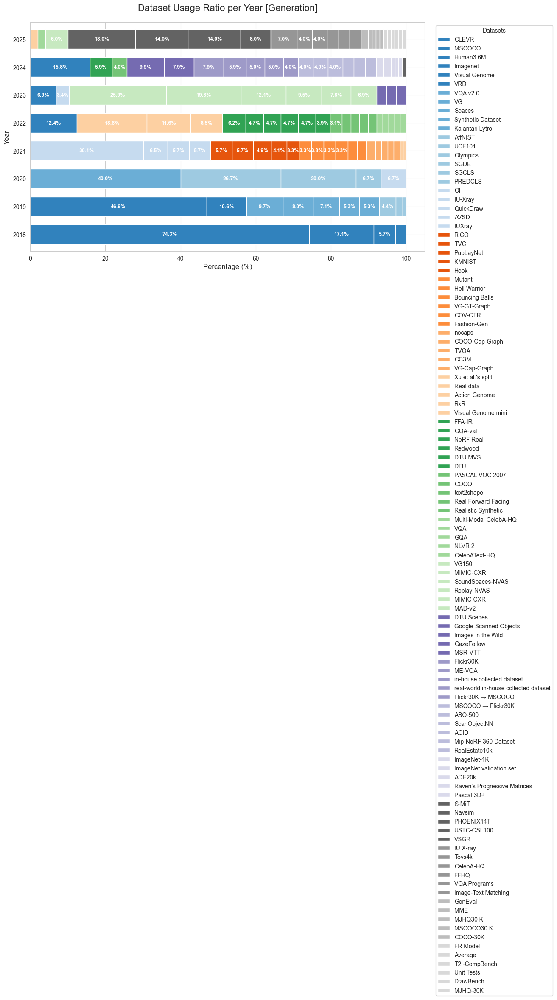

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:112: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


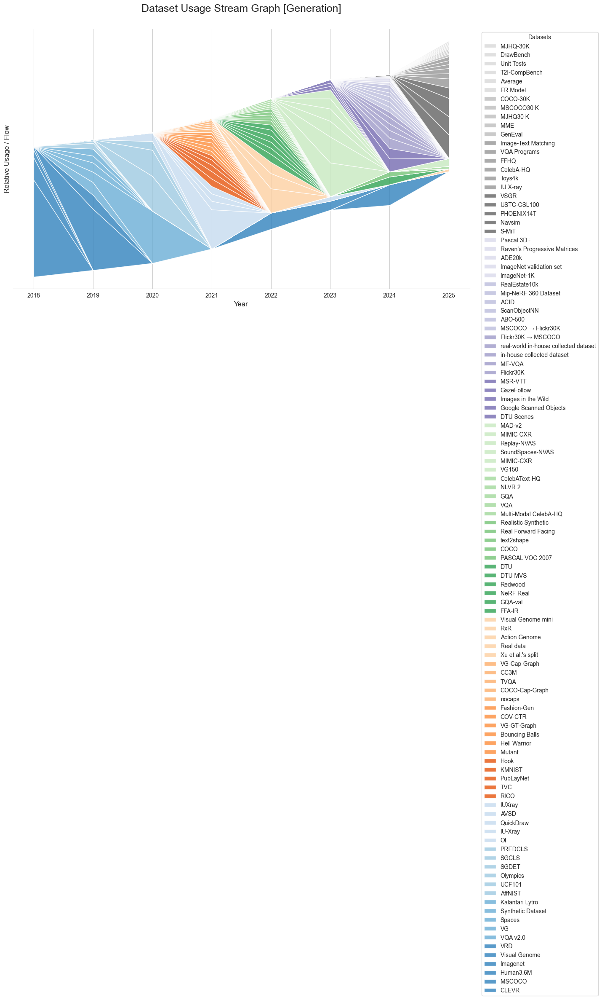

In [8]:
task = "Generation"
plot_dataset_ratio_stacked_bar(models_metrics, task)
plot_dataset_ratio_stream_graph(models_metrics, task)

## 2. Image Captioning

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


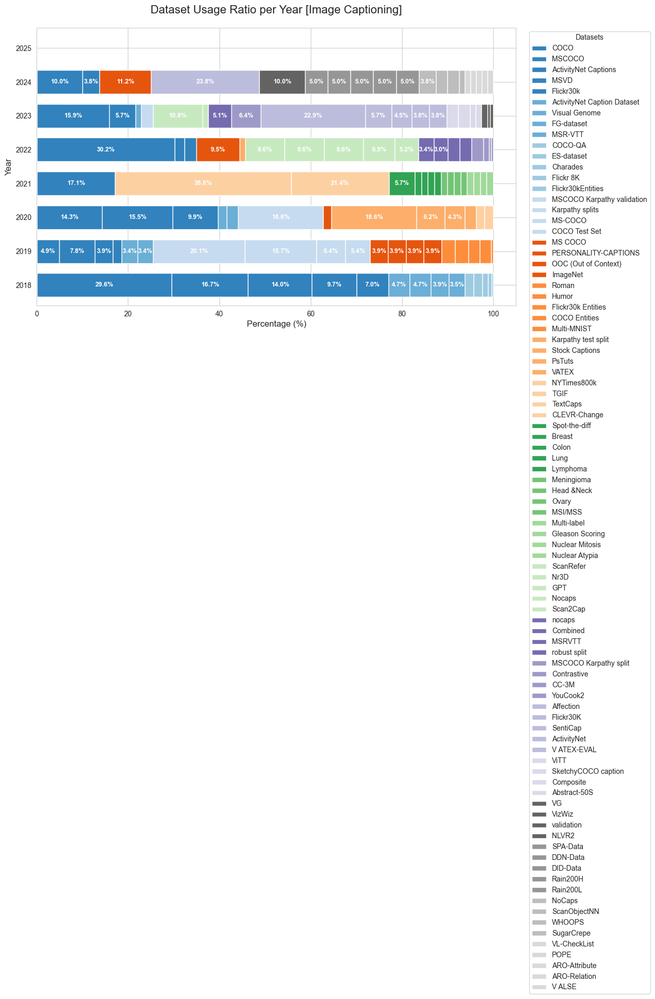

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:112: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


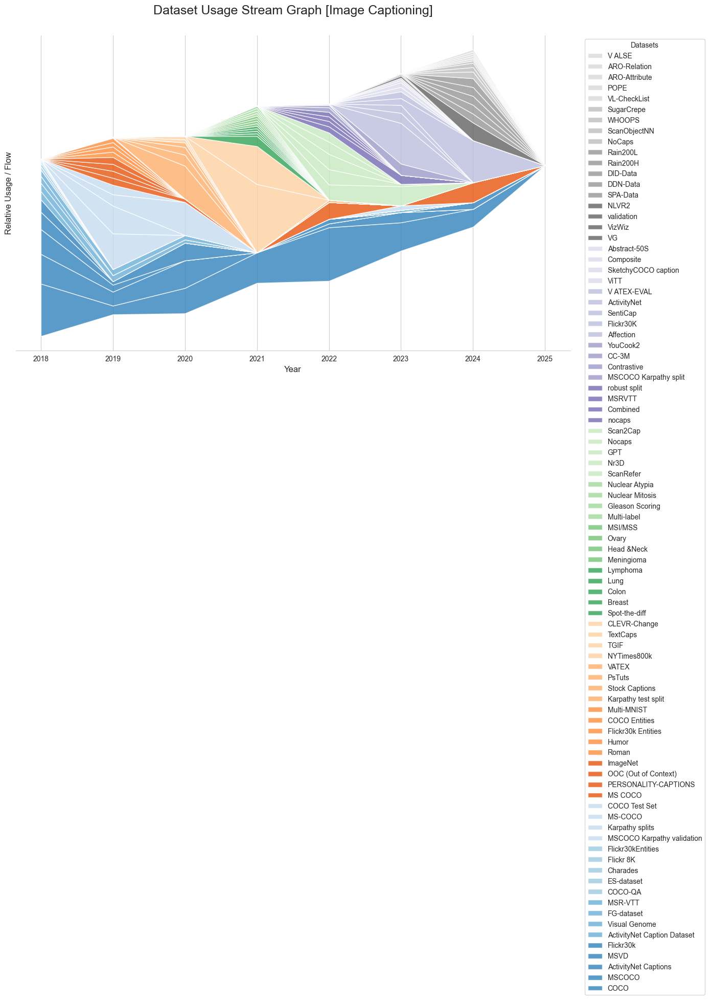

In [9]:
task = "Image Captioning"
plot_dataset_ratio_stacked_bar(models_metrics, task=task)
plot_dataset_ratio_stream_graph(models_metrics, task=task)

## 3. Image Classification

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:50: UserWarning: Glyph 8618 (\N{RIGHTWARDS ARROW WITH HOOK}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/Users/yunsehyeog/Desktop/대학교/01_비교과/01_2025데이터톤/00_code/.conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8618 (\N{RIGHTWARDS ARROW WITH HOOK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


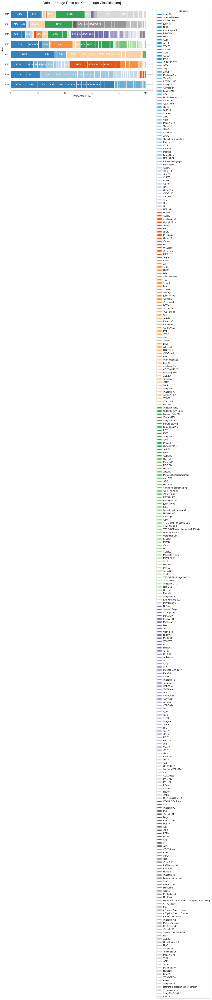

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:112: UserWarning: Glyph 8618 (\N{RIGHTWARDS ARROW WITH HOOK}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:112: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/Users/yunsehyeog/Desktop/대학교/01_비교과/01_2025데이터톤/00_code/.conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8618 (\N{RIGHTWARDS ARROW WITH HOOK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


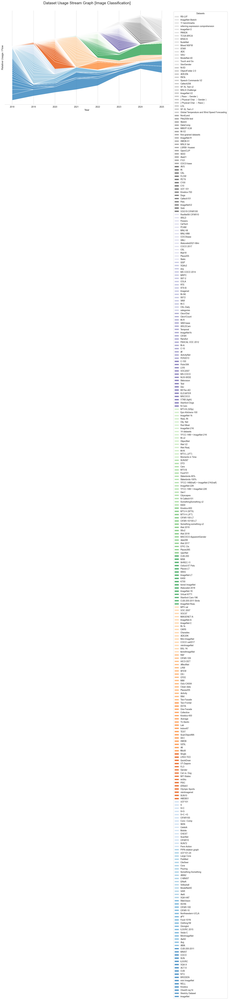

In [10]:
task = "Image Classification"
plot_dataset_ratio_stacked_bar(models_metrics, task)
plot_dataset_ratio_stream_graph(models_metrics, task)

## 4. Object Detection

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


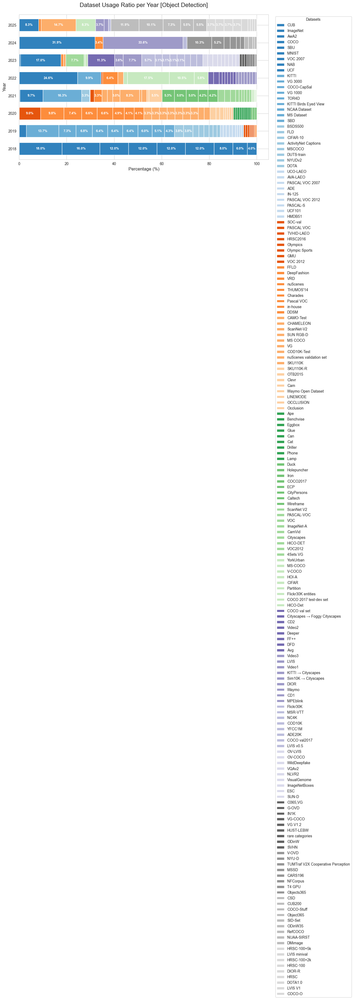

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:112: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


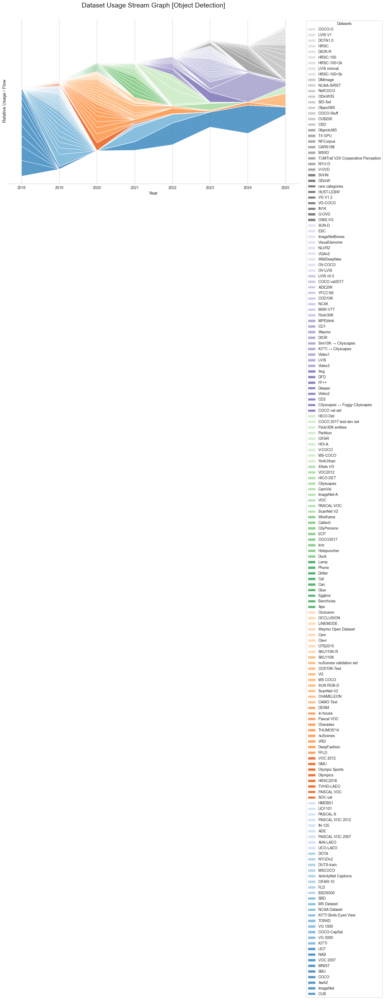

In [11]:
task = "Object Detection"
plot_dataset_ratio_stacked_bar(models_metrics, task)
plot_dataset_ratio_stream_graph(models_metrics, task)

## 5. Visual Question Answering

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:50: UserWarning: Glyph 8727 (\N{ASTERISK OPERATOR}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/Users/yunsehyeog/Desktop/대학교/01_비교과/01_2025데이터톤/00_code/.conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8727 (\N{ASTERISK OPERATOR}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


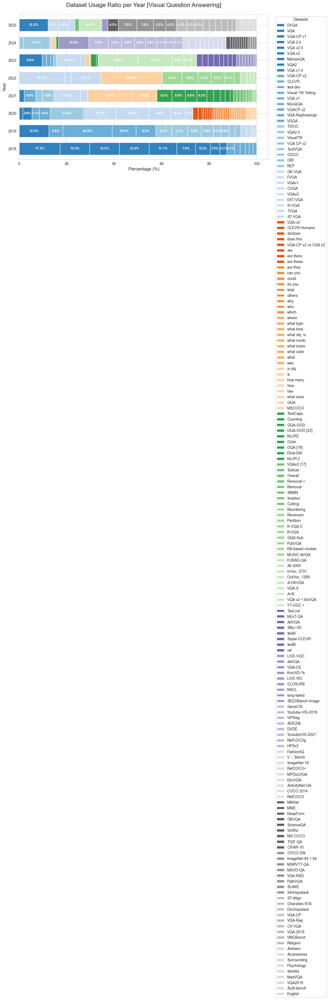

/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:112: UserWarning: Glyph 8727 (\N{ASTERISK OPERATOR}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/971928188.py:112: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/Users/yunsehyeog/Desktop/대학교/01_비교과/01_2025데이터톤/00_code/.conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8727 (\N{ASTERISK OPERATOR}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


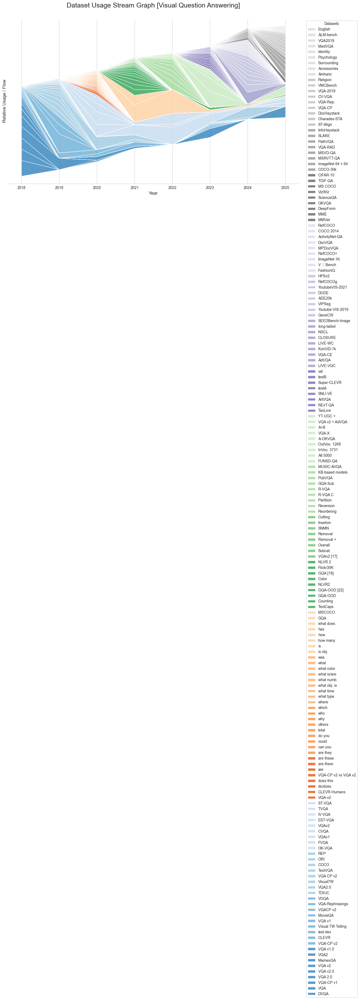

In [12]:
task = "Visual Question Answering"
plot_dataset_ratio_stacked_bar(models_metrics, task)
plot_dataset_ratio_stream_graph(models_metrics, task)

In [13]:
def check_overall_dataset_counts(metrics : dict[str, pd.DataFrame], start : int = START, end : int = END):
    datasets = pd.concat(
        [
            metrics[str(i)].dataset
            for i in range(start, end+1)
        ],
        axis=0
    )

    with pd.option_context('display.max_rows', None, 'display.max_columns', None):
        display(datasets.value_counts())    

In [14]:
check_overall_dataset_counts(cleaned_models_metrics)

dataset
COCO                                     729
ImageNet                                 323
MSCOCO                                   271
CUB                                      266
KITTI                                    227
MS-COCO                                  196
RefCOCO                                  164
Flickr30K                                160
MSR-VTT                                  133
ADE20K                                   128
CUB-200-2011                             120
ScanNet                                  118
Charades-STA                             116
ImageNet-1K                              110
VQAv2                                    109
CLEVR                                    109
SUN                                      107
VG                                       102
Visual Genome                             99
MS COCO                                   98
AWA2                                      96
ActivityNet Captions                      93
Mu

# 전처리

논문 마다 동일한 데이터 셋을 의미함에도 그 표현 방식이 다른 경우가 존재   
따락서 task를 coarse-level task 라벨을 부여한 것 처럼 데이터 셋 표현 방식을 정규화 하는 것이 필요   

1. value_counts 값이 10 이하인 데이터는 모두 drop
2. 특정 계열의 데이터는 모두 동일 표현으로 대치

마찬가지로 성능 지표 또한 그 표현 방식이 다양하기 때문에 lower case변환 후 대표 표현으로 변환

1. metric은 모두 lower case로 변환
2. metric 또한 동일한 지표를 다르게 표기한 경우 대표 표현으로 치환

In [15]:
def drop_data_under_count_k(metrics_dict, k=10, start=START, end=END):
    """
    지정된 전체 연도 범위 내에서 데이터셋의 총 등장 횟수가 k 미만인 데이터를 삭제합니다.
    """
    relevant_dfs = []
    for i in range(start, end + 1):
        year = str(i)
        if year in metrics_dict:
            relevant_dfs.append(metrics_dict[year])
    
    if not relevant_dfs:
        print("해당 범위 내에 데이터가 없습니다.")
        return {}

    total_df = pd.concat(relevant_dfs, ignore_index=True)
    
    dataset_counts = total_df['dataset'].value_counts()
    valid_datasets = dataset_counts[dataset_counts >= k].index
    
    print(f"--- 필터링 기준: 전체 기간 내 {k}회 이상 등장 ---")
    print(f"전체 데이터셋 수: {len(dataset_counts)}")
    print(f"유지 데이터셋 수: {len(valid_datasets)}")
    print("------------------------------------------")

    cleaned_metrics = {}
    for i in range(start, end + 1):
        year = str(i)
        if year not in metrics_dict:
            continue
        
        df = metrics_dict[year]

        filtered_df = df[df['dataset'].isin(valid_datasets)].copy()
        
        cleaned_metrics[year] = filtered_df
        print(f"[{year}] 필터링 완료: {len(df)} -> {len(filtered_df)} 행")
        
    return cleaned_metrics


def make_datasetName_lower(metrics, start: int = START, end: int = END):
    metrics_copy = metrics.copy()

    for i in range(start, end + 1):
        year = str(i)
        if year in metrics_copy:
            metrics_copy[year]['dataset'] = metrics_copy[year]['dataset'].astype(str).str.lower()

    return metrics_copy    


cleaned_models_metrics = drop_data_under_count_k(cleaned_models_metrics, k=20)
cleaned_models_metrics = make_datasetName_lower(cleaned_models_metrics)

--- 필터링 기준: 전체 기간 내 20회 이상 등장 ---
전체 데이터셋 수: 2176
유지 데이터셋 수: 194
------------------------------------------
[2018] 필터링 완료: 2087 -> 1116 행
[2019] 필터링 완료: 2725 -> 1195 행
[2020] 필터링 완료: 2956 -> 1234 행
[2021] 필터링 완료: 3390 -> 1566 행
[2022] 필터링 완료: 2824 -> 1247 행
[2023] 필터링 완료: 3129 -> 1532 행
[2024] 필터링 완료: 3370 -> 1281 행
[2025] 필터링 완료: 2781 -> 800 행


In [16]:
def check_overall_dataset_counts(metrics : dict[str, pd.DataFrame], start : int = START, end : int = END):
    datasets = pd.concat(
        [
            metrics[str(i)].dataset
            for i in range(start, end+1)
        ],
        axis=0
    )

    with pd.option_context('display.max_rows', None, 'display.max_columns', None):
        display(datasets.value_counts())    


check_overall_dataset_counts(cleaned_models_metrics)

dataset
coco                                  729
imagenet                              323
mscoco                                271
cub                                   266
flickr30k                             234
kitti                                 227
ms-coco                               196
refcoco                               164
ade20k                                162
msr-vtt                               133
awa2                                  130
cub-200-2011                          120
scannet                               118
charades-sta                          116
imagenet-1k                           110
clevr                                 109
vqav2                                 109
sun                                   107
vg                                    102
visual genome                          99
ms coco                                98
activitynet captions                   93
multi30k                               92
hico-det                  

확인 가능한 대표적인 데이터 셋은 다음과 같음
- coco    
- imagenet   
- flickr   
- mnist   
- awa   
- vqa   
- pascal      
- kitti      
- cifar      
- visual genome, vg

vg 계열의 데이터 셋은 모두 visual genome으로 통일

In [17]:
def replace_representative_datasetName(metrics: dict[str, pd.DataFrame], start: int = START, end: int = END):
    rep_map = {
        'coco': 'coco', 
        'imagenet': 'imagenet', 
        'flickr': 'flickr',
        'mnist': 'mnist', 
        'awa': 'awa', 
        'vqa': 'vqa', 
        'pascal': 'pascal', 
        'kitti': 'kitti', 
        'cifar': 'cifar',
        'vg': 'visual genome'  # 'vg'가 포함되면 'visual genome'으로 변경
    }
    
    metrics = metrics.copy()

    for i in range(start, end + 1):
        key = str(i)
        if key in metrics:
            metrics[key]['dataset'] = metrics[key]['dataset'].apply(
                lambda x: next((val for k, val in rep_map.items() if k in str(x).lower()), x)
            )
            
    return metrics

cleaned_models_metrics = replace_representative_datasetName(cleaned_models_metrics)

In [18]:
check_overall_dataset_counts(cleaned_models_metrics)

dataset
coco                        1742
vqa                          634
imagenet                     565
flickr                       297
kitti                        280
cub                          266
visual genome                231
awa                          204
cifar                        165
ade20k                       162
msr-vtt                      133
cub-200-2011                 120
scannet                      118
charades-sta                 116
clevr                        109
pascal                       107
sun                          107
activitynet captions          93
multi30k                      92
hico-det                      91
nuscenes                      88
ucf101                        86
r2r                           84
cityscapes                    83
scanrefer                     83
scanobjectnn                  78
msvd                          70
gqa                           67
scanqa                        65
lvis                          65
ac

In [19]:
def show_metrics_name_counts(metrics : dict[str, pd.DataFrame], start : int = START, end : int = END):
    metric_names = pd.concat(
        [
            metrics[str(i)].metric_name
            for i in range(start, end+1)
        ],
        axis=0
    )

    with pd.option_context("display.max_rows", None, "display.max_columns", None):
        display(metric_names.value_counts())


for i in range(START, END+1):
    cleaned_models_metrics[str(i)].metric_name = cleaned_models_metrics[str(i)].metric_name.astype(str).str.lower()

show_metrics_name_counts(cleaned_models_metrics)

metric_name
accuracy                                    1425
miou                                         401
top-1 accuracy                               333
map                                          316
r@1                                          251
recall@1                                     221
r@10                                         166
ap                                           161
iou                                          161
r@5                                          143
cider                                        137
meteor                                       132
psnr                                         129
auc                                          115
average precision                             94
ssim                                          86
top-1                                         83
mpjpe                                         82
bleu-4                                        72
m                                             69
recall  

In [20]:
import re
from copy import deepcopy

def get_representative_metric(metric_name: str, task: str) -> str:
    """
    이미 소문자로 처리된 metric_name과 task를 입력받아 
    정규화 통합 테이블 기준의 대표 명칭을 반환합니다.
    """
    t = task.lower().strip()
    m = metric_name.strip()

    fixed_mapping = {
        "cider": "CIDEr",
        "miou": "mIoU",
        "spice": "SPICE",
        "s": "SPICE",
        "meteor": "METEOR",
        "m": "METEOR",
        "rouge-l": "ROUGE-L",
        "r": "ROUGE-L",
        "map": "mAP",
        "auc": "AUC"
    }
    if m in fixed_mapping:
        return fixed_mapping[m]

    
    if t == "generation":
        if "accuracy" in m: return "Top-1 Accuracy"
        if "mr@50" in m: return "Mean Recall@50"
        if "r@" in m or "recall" in m: return _normalize_recall(m)

    elif t == "image captioning":
        if m in ["b@4", "bleu-4"]: return "BLEU-4"
        if m == "bleu-1": return "BLEU-1"

    elif t == "image classification":
        if "top-5" in m: return "Top-5 Accuracy"
        if any(x in m for x in ["accuracy", "acc", "top-1", "overall"]): return "Top-1 Accuracy"
        if "error" in m: return "Error Rate"

    elif t == "object detection":
        if m in ["ap", "average precision"]: return "AP"
        if "50" in m: return "AP@50"
        if "75" in m: return "AP@75"
        if "m" in m: return "AP (Medium)"
        if "3d" in m: return "AP (3D)"
        if "aph" in m: return "APH (L2)"
        if "r@1" in m: return "Recall@1"

    elif t == "visual question answering":
        if "textvqa" in m: return "TextVQA Accuracy"
        if "yes/no" in m: return "Yes/No Accuracy"
        if "context" in m: return "Context Reliance"
        if any(x in m for x in ["vqa accuracy", "vqa-score", "overall", "acc", "accuracy"]):
            return "VQA Accuracy"

    if "r@" in m or "recall" in m:
        return _normalize_recall(m)
        
    return m.upper() # 분류되지 않은 경우 대문자로 변환하여 반환

def _normalize_recall(name: str) -> str:
    """Recall 지표를 'Recall@k' 형태로 통일하는 내부 보조 함수"""
    match = re.search(r'\d+', name)
    if match:
        return f"Recall@{match.group()}"
    return "Recall"


def replace_representative_metricName(models_metrics : dict[str, pd.DataFrame], start : int = START, end : int = END):
    models_metrics = deepcopy(models_metrics)
    
    for year, df in models_metrics.items():
        df['metric_name'] = df.apply(
            lambda row: get_representative_metric(row['metric_name'], row['task']), 
            axis=1
        )

    return models_metrics

In [21]:
cleaned_models_metrics = replace_representative_metricName(cleaned_models_metrics)

# Task별 성능추이 변화 시각화 (dataset 별)

In [22]:

def visualize_dataset_performance_by_task(
    metrics_dict: dict[str, pd.DataFrame], 
    target_task: str, 
    mode: str = "average",  
    k: int = 5, 
    window: int = 3, 
    start_year: int = None, 
    end_year: int = None
):
    """
    연도별 DataFrame 딕셔너리를 입력받아 특정 Task의 성능 추이를 시각화합니다.
    
    Args:
        mode (str): 집계 방식. 
            - "average": 산술 평균 (Mean)
            - "median": 중앙값 (Median)
            - "top1": 해당 연도 최고 성능 (Max)
    """
    
    mode_map = {
        "average": ("mean", "Average Metric Value"),
        "median": ("median", "Median Metric Value"),
        "top1": ("max", "Top-1 (Max) Metric Value")
    }
    
    if mode not in mode_map:
        raise ValueError(f"Invalid mode: '{mode}'. Choose from {list(mode_map.keys())}")
    
    agg_func, y_label = mode_map[mode]

    all_data = []
    for year_str, year_df in metrics_dict.items():
        year_int = int(year_str)
        if (start_year and year_int < start_year) or (end_year and year_int > end_year):
            continue
        
        temp_df = year_df.copy()
        temp_df['year'] = year_int
        all_data.append(temp_df)

    if not all_data:
        print("해당 범위 내에 데이터가 존재하지 않습니다.")
        return

    df = pd.concat(all_data, ignore_index=True)

    task_df = df[df['task'] == target_task].copy()
    if task_df.empty:
        print(f"'{target_task}'에 해당하는 데이터가 없습니다.")
        return

    top_k_datasets = task_df['dataset'].value_counts().nlargest(k).index
    filtered_df = task_df[task_df['dataset'].isin(top_k_datasets)]

    summary = (
        filtered_df.groupby(['dataset', 'year'])['metric_value']
        .agg(agg_func)  # 선택된 모드(mean, median, max) 적용
        .reset_index()
        .sort_values(['dataset', 'year'])
    )

    summary['moving_avg'] = summary.groupby('dataset')['metric_value'].transform(
        lambda x: x.rolling(window=window, min_periods=1).mean()
    )

    plt.figure(figsize=(14, 7))
    sns.set_style("whitegrid")

    sns.lineplot(
        data=summary, x='year', y='moving_avg', hue='dataset',
        marker='o', linewidth=2.5, markersize=8, palette='tab10'
    )

    sns.scatterplot(
        data=summary, x='year', y='metric_value', hue='dataset',
        alpha=0.3, legend=False, palette='tab10'
    )

    title_suffix = f"({mode.capitalize()} Performance)"
    plt.title(f'Performance Trends: Top-{k} Datasets in "{target_task}"\n{title_suffix} | {window}-Year Moving Average', 
              fontsize=16, pad=15)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(y_label, fontsize=12)
    
    plt.legend(title='Datasets', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.xticks(sorted(summary['year'].unique()))
    
    plt.tight_layout()
    plt.show()

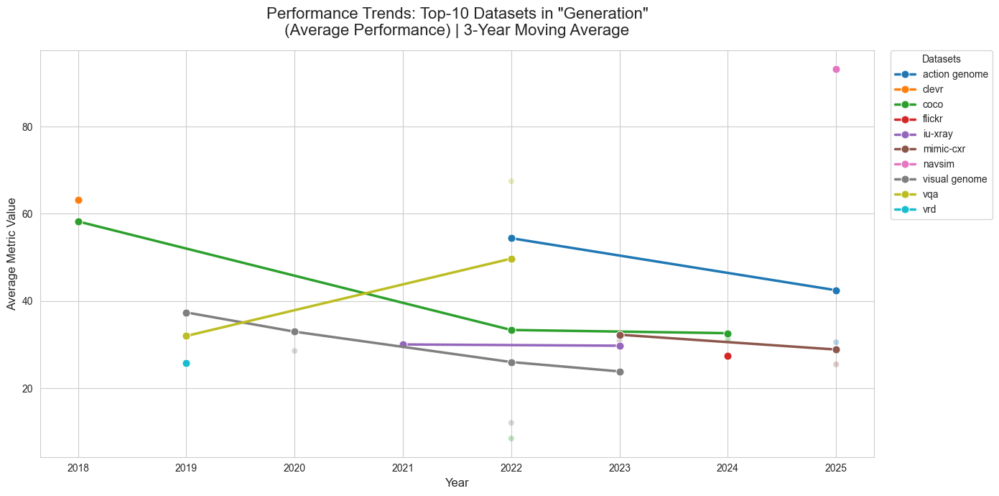

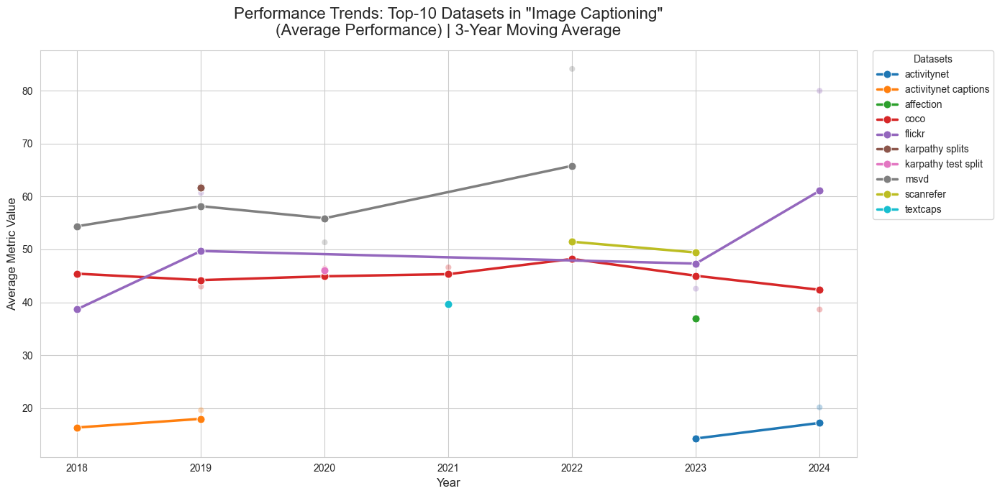

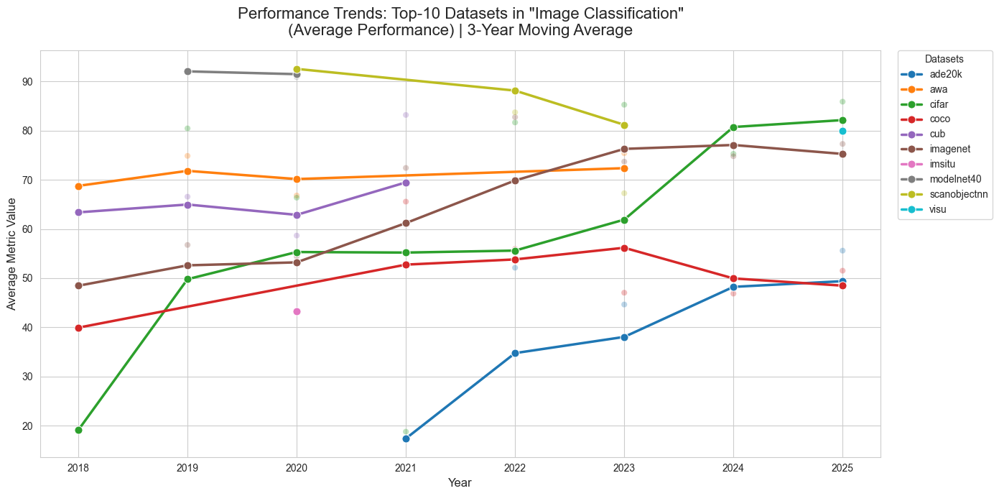

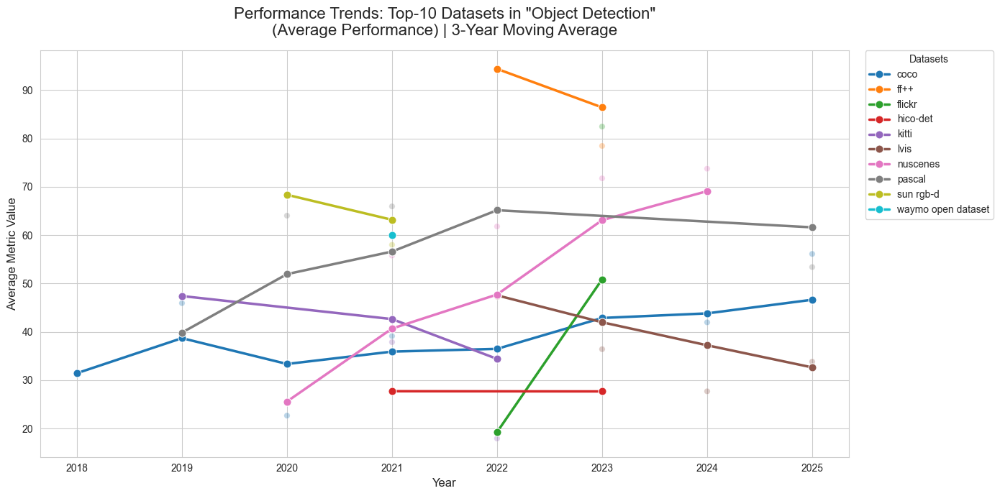

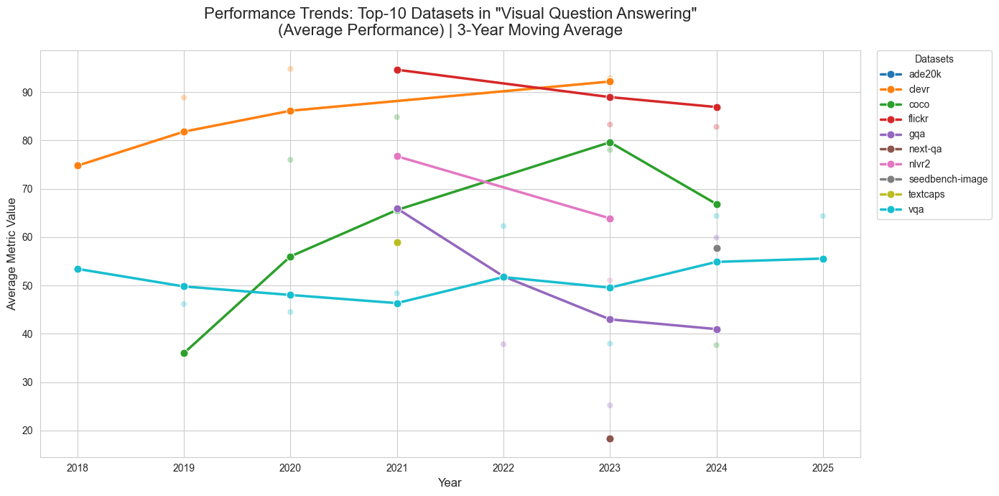

In [23]:
for target_task in ["Generation", "Image Captioning", "Image Classification", "Object Detection", "Visual Question Answering"]:
    visualize_dataset_performance_by_task(
        metrics_dict=cleaned_models_metrics,
        target_task=target_task, 
        mode="average",
        k=10, 
        window=3
    )

In [24]:

def visualize_topk_metrics_trends(
    metrics_dict: dict[str, pd.DataFrame],
    target_task: str,
    k: int = 5,
    metrics_name: list[str] | None = None,
    mode: str = "average",
    window: int = 3,
    start_year: int | None = START,
    end_year: int | None = END,
):
    """
    단일 task에 대해 metric_name 등장 빈도 기준 Top-K metric들의
    연도별 성능 변화 추이를 하나의 plot에 시각화합니다.
    """

    mode_map = {
        "average": ("mean", "Average Metric Value"),
        "median": ("median", "Median Metric Value"),
        "top1": ("max", "Top-1 Metric Value"),
    }

    if mode not in mode_map:
        raise ValueError(f"Invalid mode: {mode}")

    agg_func, y_label = mode_map[mode]

    dfs = []
    for year_str, df in metrics_dict.items():
        year = int(year_str)
        if (start_year and year < start_year) or (end_year and year > end_year):
            continue

        tmp = df.copy()
        tmp["year"] = year
        dfs.append(tmp)

    if not dfs:
        raise ValueError("지정한 연도 범위에 데이터가 없습니다.")

    df = pd.concat(dfs, ignore_index=True)

    df = df[df["task"] == target_task]
    if df.empty:
        raise ValueError(f"Task '{target_task}'에 해당하는 데이터가 없습니다.")

    if metrics_name is not None:
        df = df[df["metric_name"].isin(metrics_name)]

    topk_metrics = (
        df["metric_name"]
        .value_counts()
        .nlargest(k)
        .index
        .tolist()
    )

    df = df[df["metric_name"].isin(topk_metrics)]

    summary = (
        df
        .groupby(["metric_name", "year"])["metric_value"]
        .agg(agg_func)
        .reset_index()
        .sort_values(["metric_name", "year"])
    )

    summary["moving_avg"] = (
        summary
        .groupby("metric_name")["metric_value"]
        .transform(lambda x: x.rolling(window=window, min_periods=1).mean())
    )

    plt.figure(figsize=(14, 7))
    sns.set_style("whitegrid")

    sns.lineplot(
        data=summary,
        x="year",
        y="moving_avg",
        hue="metric_name",
        marker="o",
        linewidth=2.5,
    )

    sns.scatterplot(
        data=summary,
        x="year",
        y="metric_value",
        hue="metric_name",
        alpha=0.35,
        legend=False,
    )

    plt.title(
        f'Top-{k} Metrics Trend by Frequency\n'
        f'Task: {target_task} | {mode.capitalize()} ({window}-Year MA)',
        fontsize=16,
        pad=12,
    )
    plt.xlabel("Year")
    plt.ylabel(y_label)
    plt.xticks(sorted(summary["year"].unique()))
    plt.legend(title="Metric Name", bbox_to_anchor=(1.02, 1), loc="upper left")

    plt.tight_layout()
    plt.show()


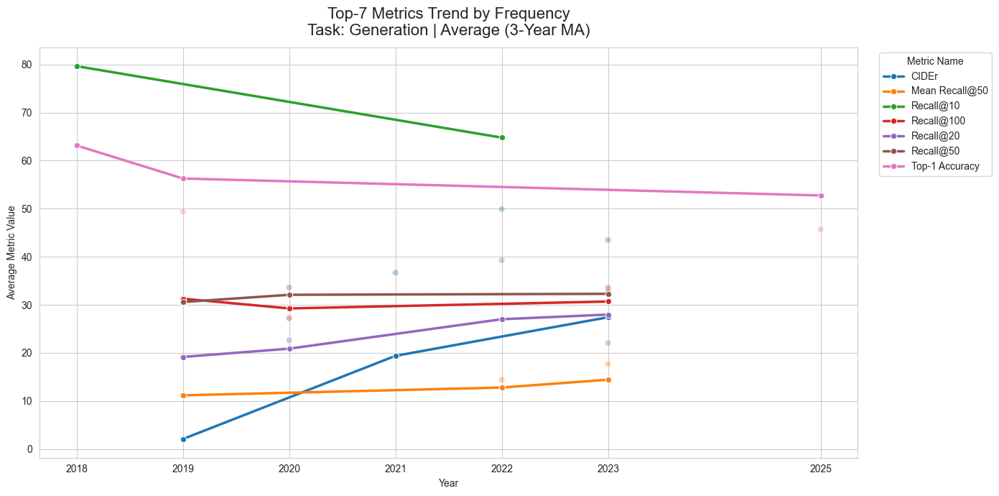

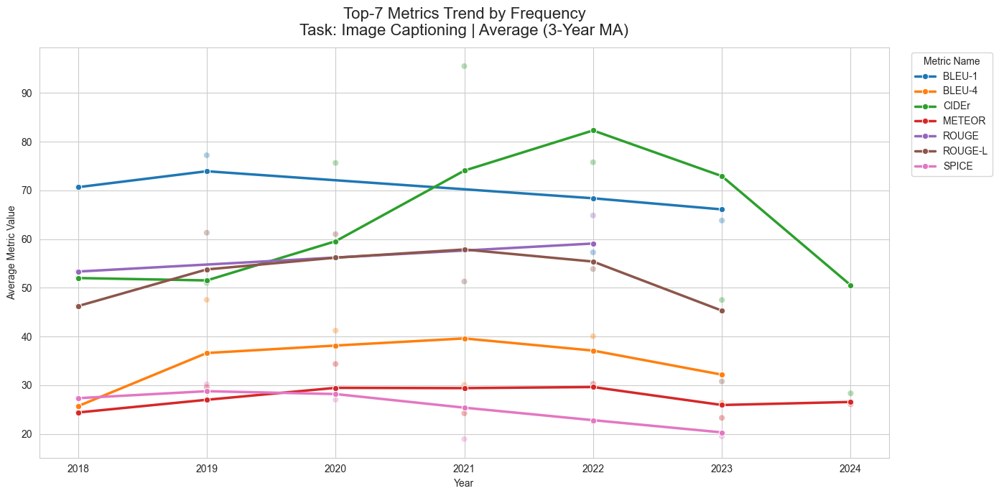

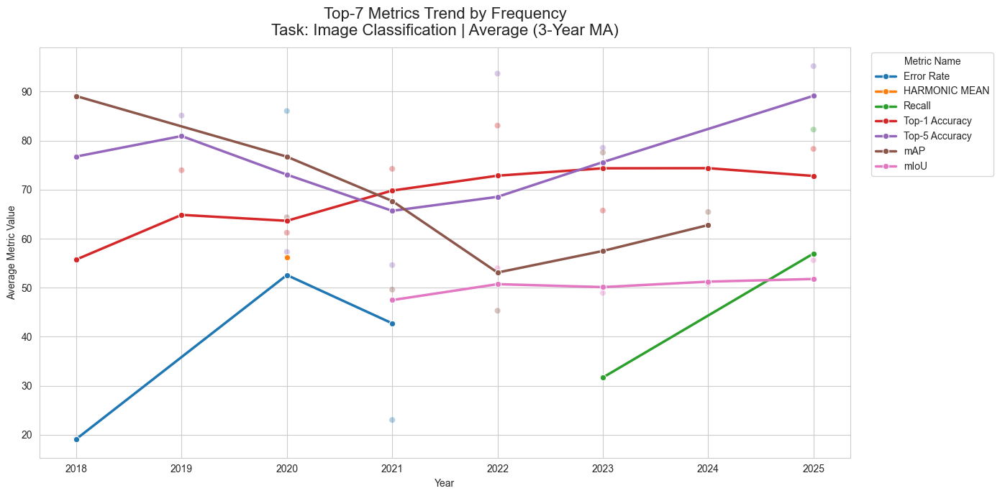

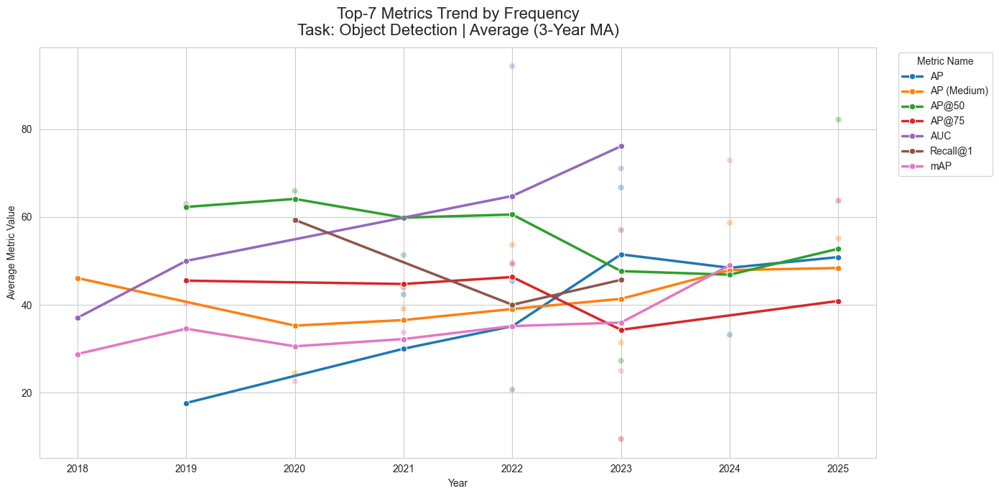

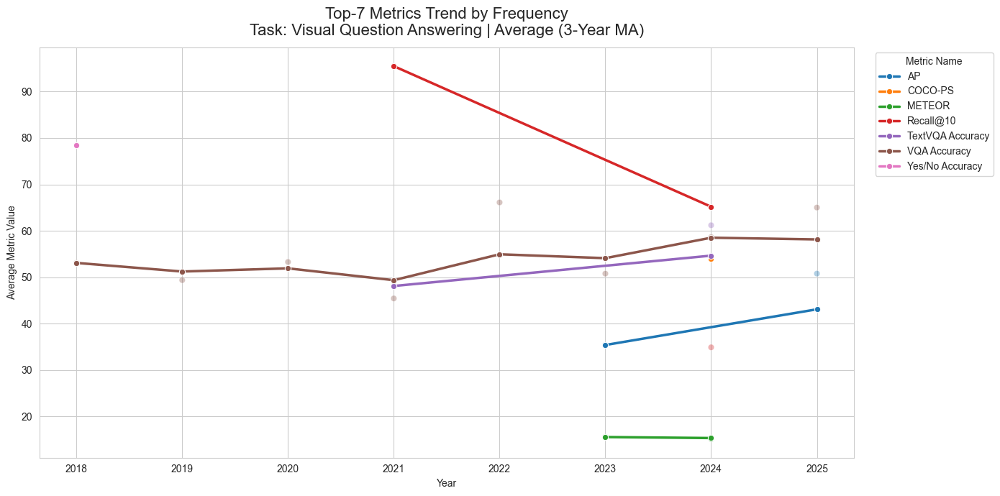

In [25]:
for target_task in ["Generation", "Image Captioning", "Image Classification", "Object Detection", "Visual Question Answering"]:
    visualize_topk_metrics_trends(
        metrics_dict=cleaned_models_metrics,
        target_task=target_task, 
        mode="average",
        k=7, 
        window=3
    )

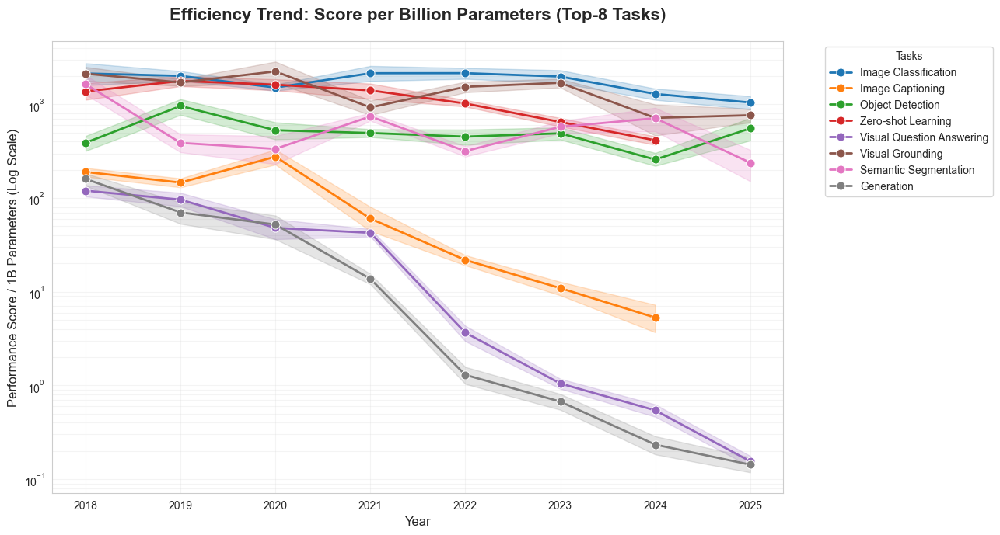

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

def prepare_combined_df(cleaned_models_metrics):
    """모든 연도의 데이터를 하나의 데이터프레임으로 통합합니다."""
    all_data = []
    for year, df in cleaned_models_metrics.items():
        temp_df = df.copy()
        temp_df['year'] = int(year)
        all_data.append(temp_df)
    return pd.concat(all_data, ignore_index=True)

def get_global_top_k_tasks(df, k=10):
    """전체 기간 기준 상위 k개 태스크 추출"""
    filtered_df = df[df['task'].str.lower() != 'other']
    top_k_tasks = filtered_df['task'].value_counts().nlargest(k).index.tolist()
    return top_k_tasks


def plot_ratio_plot_separate_legend(df, k=10):
    """효율성 지표 시각화 (데이터가 M 단위인 경우)"""
    top_tasks = get_global_top_k_tasks(df, k)
    df_filtered = df[df['task'].isin(top_tasks)].copy()
    
    df_filtered['perf_per_billion'] = df_filtered['metric_value'] / (df_filtered['parameter_count'] / 1000)
    
    fig, ax = plt.subplots(figsize=(13, 7))
    
    sns.lineplot(data=df_filtered, x='year', y='perf_per_billion', hue='task', 
                 hue_order=top_tasks, marker='o', markersize=8, linewidth=2, ax=ax)
    
    ax.set_title(f'Efficiency Trend: Score per Billion Parameters (Top-{k} Tasks)', 
                 fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Year', fontsize=12)
    ax.set_ylabel('Performance Score / 1B Parameters (Log Scale)', fontsize=12)
    
    ax.set_yscale('log')
    
    ax.grid(True, which="both", ls="-", alpha=0.2)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Tasks')
    
    plt.tight_layout()
    plt.show()


combined_df = prepare_combined_df(cleaned_models_metrics)
plot_ratio_plot_separate_legend(combined_df, k=8)

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_task_kde_by_year(df, task_name):
    """
    특정 태스크에 대해 연도별 파라미터 수 vs 성능의 밀도(KDE)를 그립니다.
    """
    task_df = df[df['task'] == task_name].copy()
    
    if task_df.empty:
        print(f"Warning: '{task_name}' 태스크에 데이터가 없습니다.")
        return

    fig, ax = plt.subplots(figsize=(12, 8))
    
    sns.kdeplot(
        data=task_df, 
        x='parameter_count', 
        y='metric_value', 
        hue='year', 
        fill=True, 
        log_scale=(True, False), 
        palette='viridis', 
        alpha=0.4,
        ax=ax
    )
    
    sns.scatterplot(
        data=task_df, 
        x='parameter_count', 
        y='metric_value', 
        hue='year', 
        palette='viridis', 
        s=30, 
        alpha=0.6, 
        legend=False, 
        ax=ax
    )

    ax.set_title(f'Density Distribution: {task_name}', fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Parameter Count (Millions, Log Scale)', fontsize=12)
    ax.set_ylabel('Metric Value (0-100)', fontsize=12)
    ax.set_ylim(0, 100) # 성능 범위 고정
    
    ax.grid(True, which="both", ls="--", alpha=0.2)
    plt.tight_layout()
    plt.show()


/var/folders/1n/3_46_bbx39l4m34jz8q8xbmr0000gn/T/ipykernel_46671/1513903485.py:16: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(


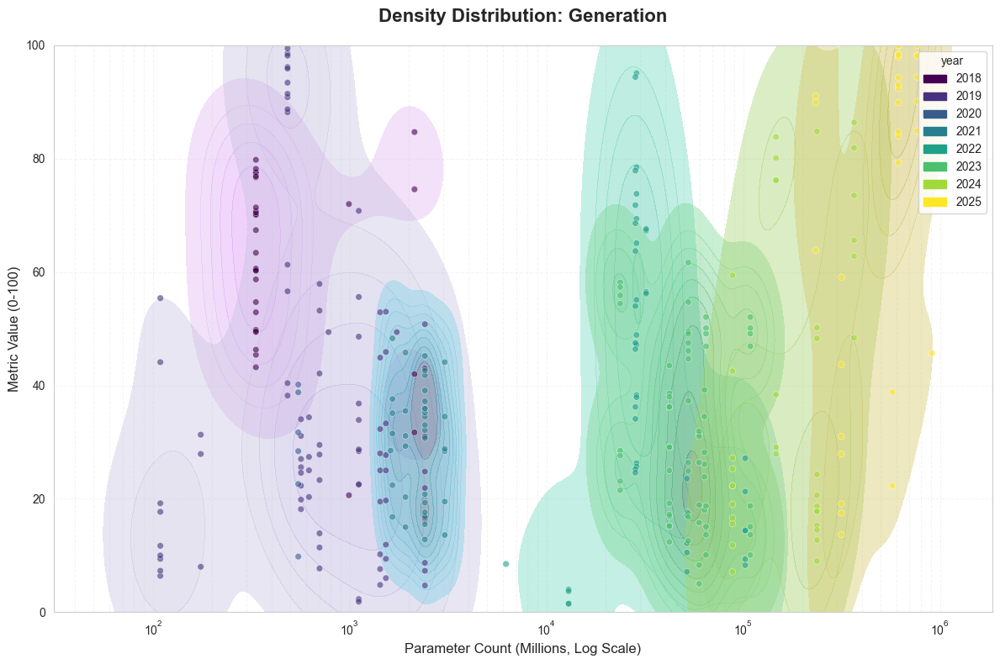

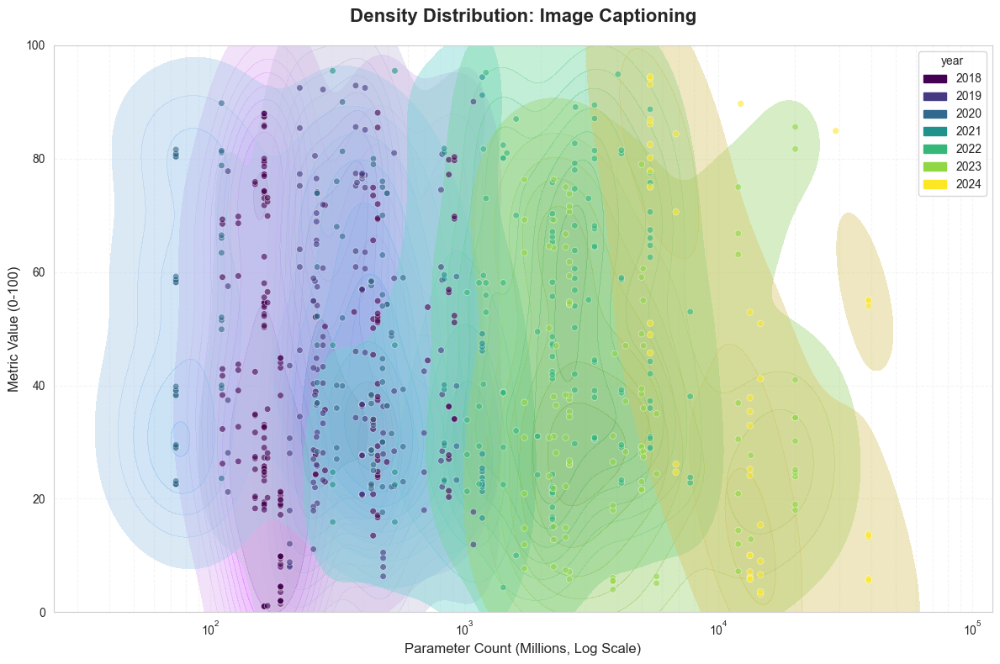

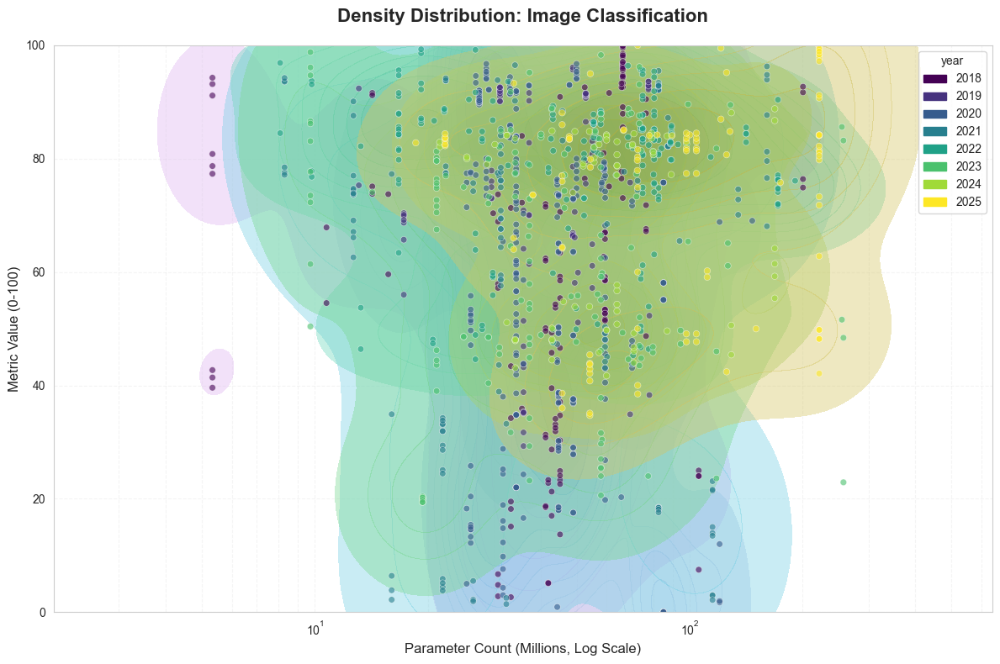

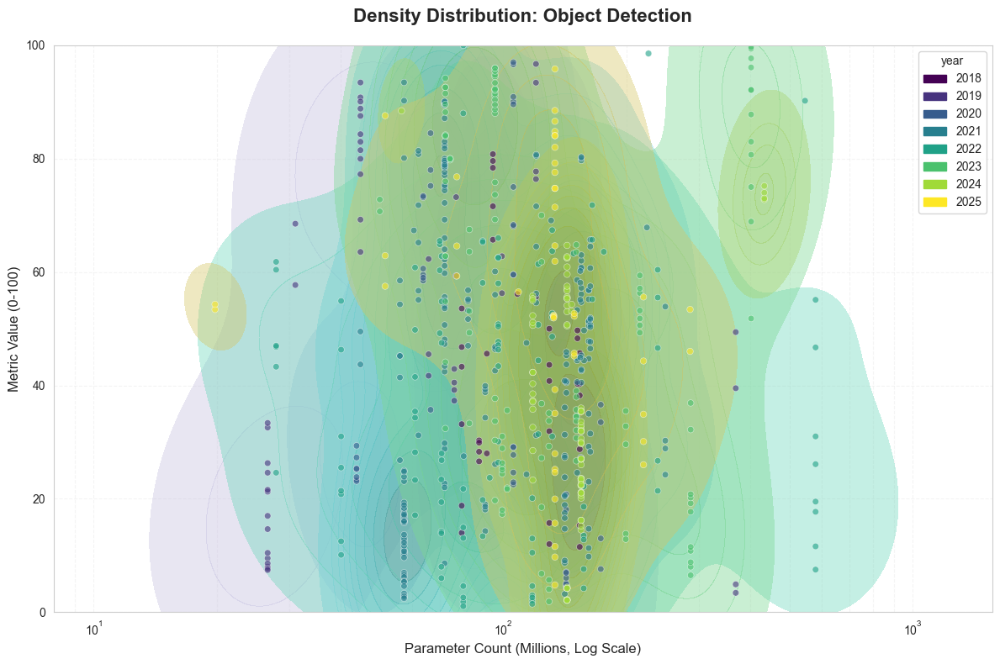

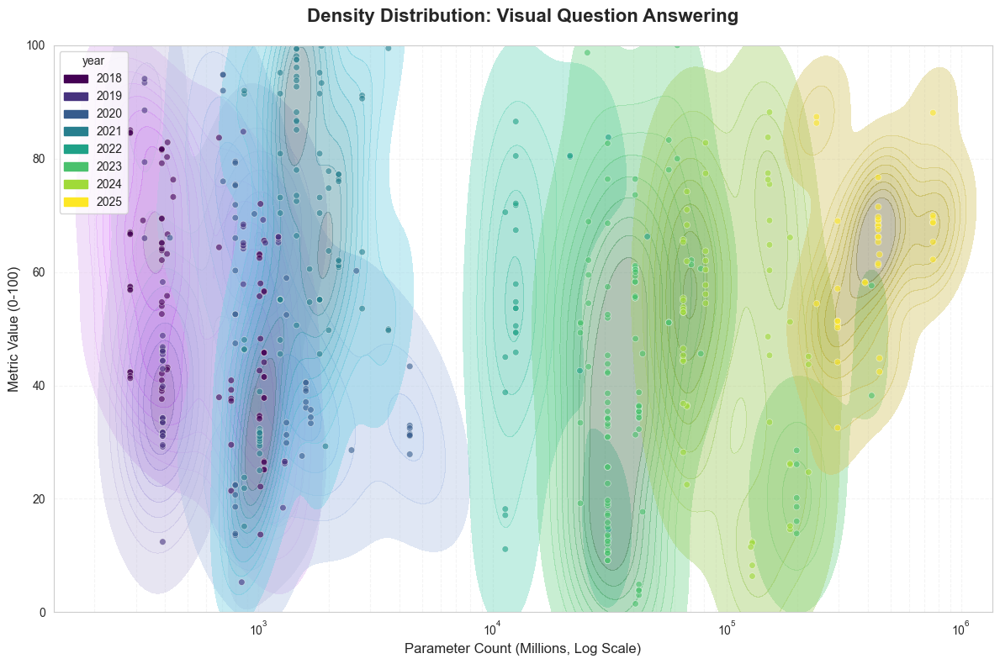

In [28]:
TOP_K_TASK_LIST = ["Generation", "Image Captioning", "Image Classification", "Object Detection", "Visual Question Answering"]

for task in TOP_K_TASK_LIST:
    plot_task_kde_by_year(combined_df, task)

# Task간 성능, 파라미터 상관간계 분석

In [29]:
from scipy.spatial.distance import jensenshannon

def detect_robust_differentiation(models_metrics, task, target_col='dataset', start_year=START, end_year=END, max_window=3, bins=10):
    """
    Causal Multi-scale JSD: 특정 연도가 '과거'의 분포들과 얼마나 다른지 측정합니다. (미래 참조 없음)
    """
    years = [str(y) for y in range(start_year, end_year + 1)]
    distributions = {}
    
    all_data = []
    for year in years:
        if year in models_metrics:
            df = models_metrics[year]
            task_df = df[df['task'] == task]
            if not task_df.empty:
                all_data.append(task_df[target_col].dropna())
    
    if not all_data: return None
    combined_series = pd.concat(all_data)

    if target_col == 'dataset' or combined_series.dtype == 'object':
        categories = sorted(combined_series.astype(str).unique())
        for year in years:
            if year in models_metrics:
                task_df = models_metrics[year][models_metrics[year]['task'] == task]
                if not task_df.empty:
                    counts = task_df[target_col].astype(str).value_counts(normalize=True).to_dict()
                    distributions[year] = np.array([counts.get(c, 0.0) for c in categories])
    else:
        min_val, max_val = combined_series.min(), combined_series.max()
        bin_edges = np.linspace(min_val, max_val, bins + 1)
        for year in years:
            if year in models_metrics:
                task_df = models_metrics[year][models_metrics[year]['task'] == task]
                if not task_df.empty:
                    hist, _ = np.histogram(task_df[target_col].dropna(), bins=bin_edges, density=True)
                    distributions[year] = hist / (hist.sum() + 1e-9)

    robust_results = []
    valid_years = sorted(distributions.keys())
    
    for i, target_year in enumerate(valid_years):
        if i == 0: continue
        
        diff_scores = []

        for k in range(1, max_window + 1):
            if i - k >= 0:
                p_past = distributions[valid_years[i-k]]
                q_current = distributions[target_year]
                diff_scores.append(jensenshannon(p_past, q_current, base=2))
        
        if diff_scores:
    
            robust_results.append({
                'year': int(target_year), 
                f'jsd_{target_col}': np.mean(diff_scores)
            })

    return pd.DataFrame(robust_results)


In [30]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

def verify_yearly_distribution_change(models_metrics, task, target_col='dataset', start_year=START, end_year=END, bins=10):
    """
    연도별 분포 변화에 대해 카이제곱 검증을 실시합니다.
    논문에서 제안한 것처럼 분포 간의 차이가 통계적으로 유의미한지(p-value) 확인합니다.
    """
    years = [str(y) for y in range(start_year, end_year + 1)]
    raw_counts = {}

    all_data = []
    for year in years:
        if year in models_metrics:
            df = models_metrics[year]
            task_df = df[df['task'] == task]
            if not task_df.empty:
                all_data.append(task_df[target_col].dropna())
    
    if not all_data: return None
    combined_series = pd.concat(all_data)
    if target_col == 'dataset' or combined_series.dtype == 'object':
        categories = sorted(combined_series.astype(str).unique())
        for year in years:
            if year in models_metrics:
                task_df = models_metrics[year][models_metrics[year]['task'] == task]
                if not task_df.empty:
        
                    counts_dict = task_df[target_col].astype(str).value_counts().to_dict()
                    raw_counts[year] = np.array([counts_dict.get(c, 0) for c in categories])
    else:
        min_val, max_val = combined_series.min(), combined_series.max()
        bin_edges = np.linspace(min_val, max_val, bins + 1)
        for year in years:
            if year in models_metrics:
                task_df = models_metrics[year][models_metrics[year]['task'] == task]
                if not task_df.empty:
        
                    hist, _ = np.histogram(task_df[target_col].dropna(), bins=bin_edges)
                    raw_counts[year] = hist
    test_results = []
    valid_years = sorted(raw_counts.keys())
    
    for i in range(len(valid_years) - 1):
        year_current = valid_years[i]
        year_next = valid_years[i+1]
        
        contingency_table = np.array([raw_counts[year_current], raw_counts[year_next]])
        
        contingency_table = contingency_table[:, contingency_table.sum(axis=0) > 0]
        
        try:

            chi2, p, dof, expected = chi2_contingency(contingency_table)
            
            test_results.append({
                'comparison': f"{year_current} -> {year_next}",
                'chi2_stat': chi2,
                'p_value': p,
                'dof': dof,
                'is_significant': p < 0.05  # 유의수준 0.05 기준
            })
        except ValueError:

            continue

    return pd.DataFrame(test_results)

In [31]:
task_list = ["Generation", "Image Captioning", "Image Classification", "Object Detection", "Visual Question Answering"]
for task in task_list:
    result = verify_yearly_distribution_change(models_metrics, task=task)
    print(result[result.is_significant == False])

Empty DataFrame
Columns: [comparison, chi2_stat, p_value, dof, is_significant]
Index: []
Empty DataFrame
Columns: [comparison, chi2_stat, p_value, dof, is_significant]
Index: []
Empty DataFrame
Columns: [comparison, chi2_stat, p_value, dof, is_significant]
Index: []
Empty DataFrame
Columns: [comparison, chi2_stat, p_value, dof, is_significant]
Index: []
Empty DataFrame
Columns: [comparison, chi2_stat, p_value, dof, is_significant]
Index: []


In [32]:
def get_smoothed_metrics(models_metrics, task, target_col, start_year, end_year, max_window=3, ma_window=3):
    """ JSD 계산 후 이동평균이 적용된 DataFrame을 반환합니다. """
    df = detect_robust_differentiation(
        models_metrics, task, target_col, start_year, end_year, max_window
    )
    
    if df is not None and not df.empty:
        val_col = f'jsd_{target_col}'
        ma_col = f'{val_col}_ma'
        df[ma_col] = df[val_col].rolling(window=ma_window, min_periods=1).mean()
    
    return df
    

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_robust_trend(models_metrics, target_tasks, start_year=START, end_year=END, max_window=3, ma_window=3):
    """ 이동평균이 적용된 JSD 트렌드를 시각화합니다. """
    sns.set_style("whitegrid")
    tasks = [target_tasks] if isinstance(target_tasks, str) else target_tasks

    for task in tasks:
        # 데이터 확보
        ds_df = get_smoothed_metrics(models_metrics, task, 'dataset', start_year, end_year, max_window, ma_window)
        param_df = get_smoothed_metrics(models_metrics, task, 'parameter_count', start_year, end_year, max_window, ma_window)

        if ds_df is None or param_df is None:
            print(f"No data available for task: {task}")
            continue

        merged = pd.merge(ds_df, param_df, on='year')
        
        fig, ax1 = plt.subplots(figsize=(12, 6))
        ax2 = ax1.twinx()

        # --- Dataset JSD (Left Axis) ---
        color_ds = 'tab:blue'
        # 원본 데이터 (연한 점선)
        ax1.plot(merged['year'], merged['jsd_dataset'], color=color_ds, alpha=0.2, linestyle='--', label='Dataset JSD (Raw)')
        # 이동평균 (진한 실선)
        ax1.plot(merged['year'], merged['jsd_dataset_ma'], color=color_ds, linewidth=3, marker='o', label=f'Dataset JSD MA)')
        
        # --- Parameter JSD (Right Axis) ---
        color_pr = 'tab:red'
        ax2.plot(merged['year'], merged['jsd_parameter_count'], color=color_pr, alpha=0.2, linestyle='--', label='Param JSD (Raw)')
        ax2.plot(merged['year'], merged['jsd_parameter_count_ma'], color=color_pr, linewidth=3, marker='s', label=f'Param JSD MA)')

        # 스타일링
        ax1.set_xlabel('Year', fontsize=12)
        ax1.set_ylabel('Dataset Differentiation Index', color=color_ds, fontsize=12)
        ax2.set_ylabel('Parameter Shift Index', color=color_pr, fontsize=12)
        
        plt.title(f"Smoothing Causal Differentiation: {task}\n(Moving Average Window", fontsize=14, pad=20)
        
        # 범례 통합
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', frameon=True)

        plt.tight_layout()
        plt.show()

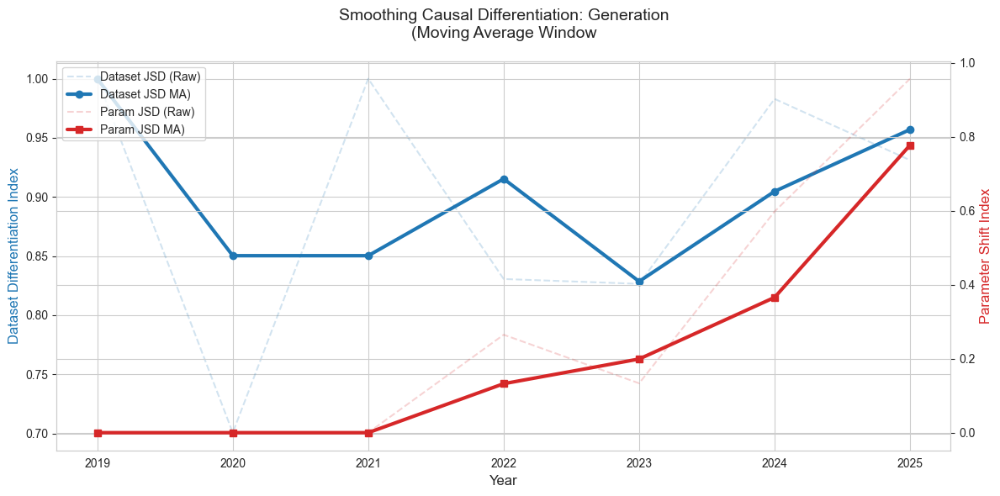

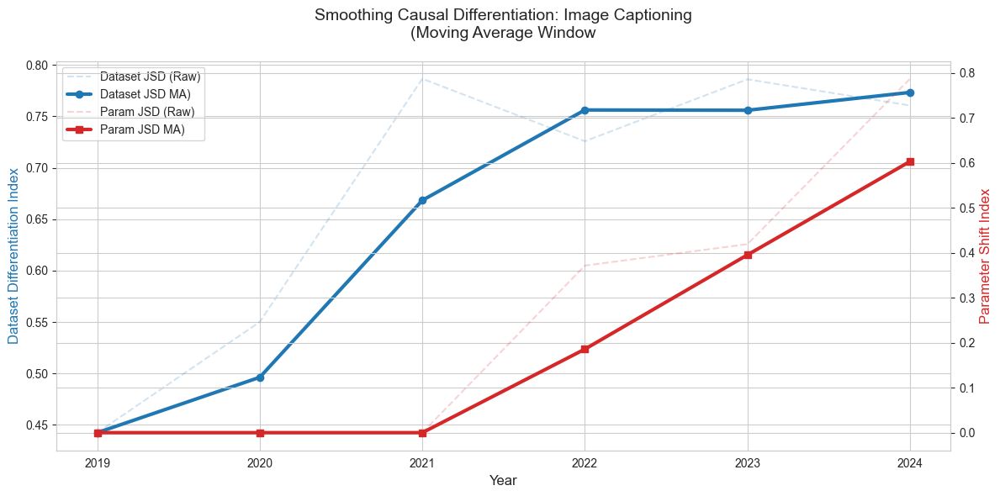

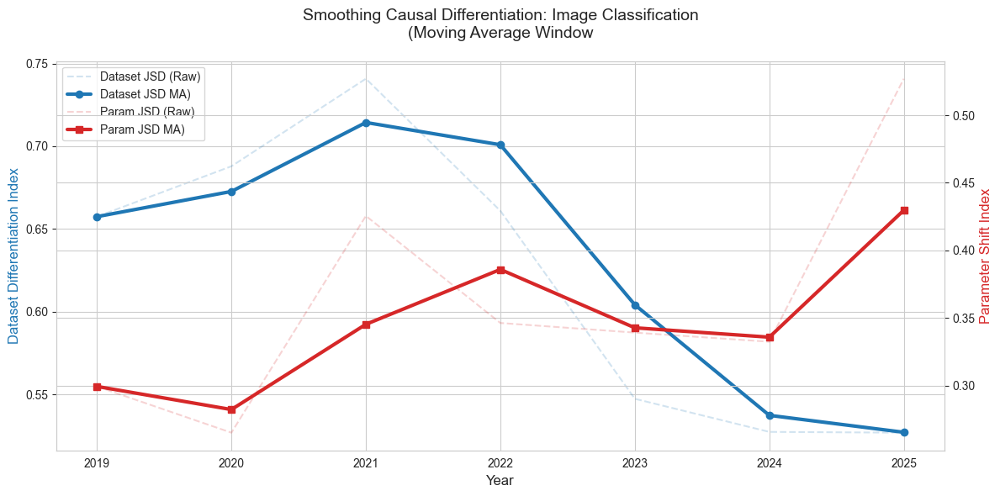

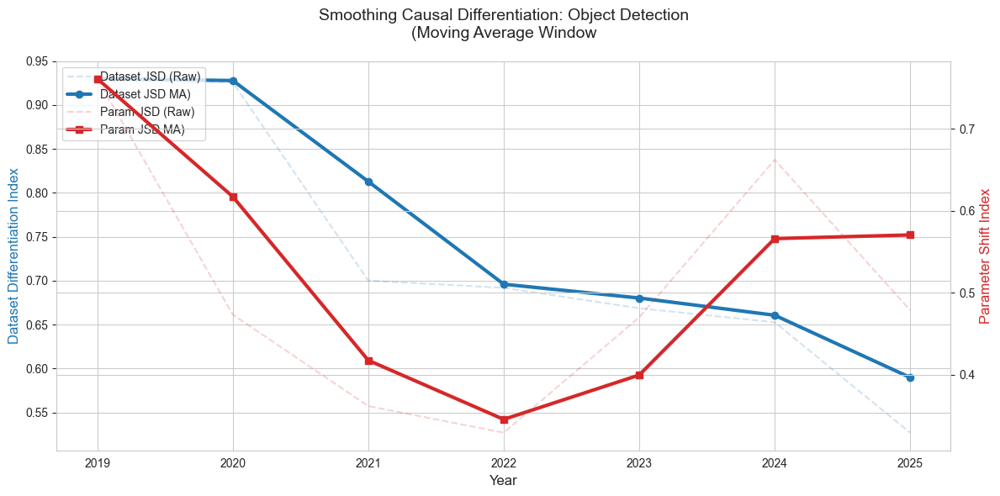

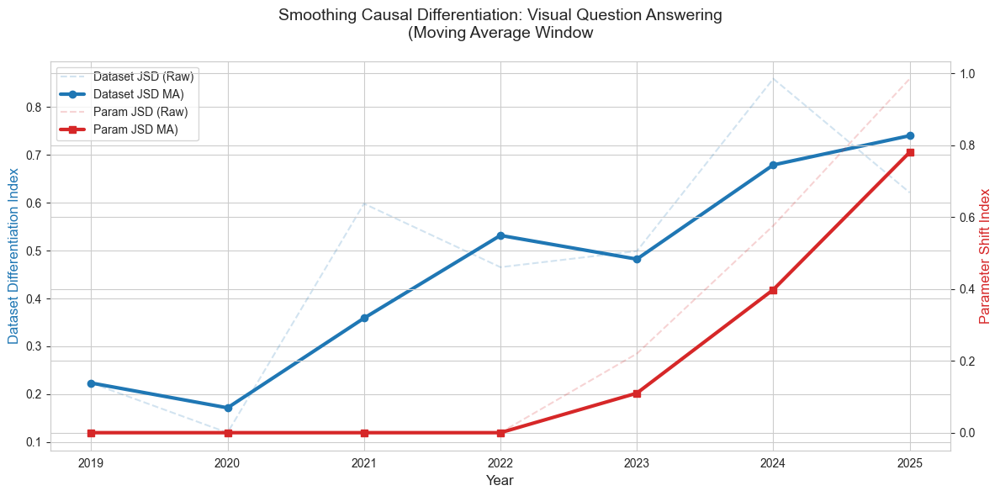

In [37]:
for task in task_list:
    visualize_robust_trend(cleaned_models_metrics, target_tasks=task, max_window=2, ma_window=2)